## Imports

In [ ]:
# EXPORT
# --- Must haves ---
import os, sys
sys.path.append('..')

import torch
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter
import torch.cuda as cuda
import torch.nn as nn
import torchvision
import torch.nn.functional as F

from surrogates4sims.datasets import MantaFlowDataset, getSingleSim, createMantaFlowTrainTest

from surrogates4sims.utils import create_opt, create_one_cycle, find_lr, printNumModelParams, \
                                    rmse, writeMessage, plotSampleWprediction, plotSampleWpredictionByChannel, \
                                    plotSample, curl, jacobian, stream2uv, create_movie, convertSimToImage

#from surrogates4sims.models import Generator, Encoder, AE_no_P, AE_xhat_z, AE_xhat_zV2

from surrogates4sims.train import trainEpoch, validEpoch

from surrogates4sims.svd import MantaFlowSVDDataset

import numpy as np
from tqdm import tqdm
from copy import deepcopy
import matplotlib.pyplot as plt

## Settings

In [ ]:
DEBUG = False
# model name, for tensorboard recording and checkpointing purposes.
versionName = "LIN_SVD_only_z_and_p_LSTM_bidirec"

# GPU Numbers to use. Comma seprate them for multi-GPUs.
gpu_ids = "2"#,1,2,3"
versionName = versionName + '_GPUs{}'.format(gpu_ids.replace(',',''))
# path to load model weights.
pretrained_path = None

# rate at which to record metrics. (number of batches to average over when recording metrics, e.g. "every 5 batches")
tensorboard_rate = 5

# number of epochs to train. This is defined here so we can use the OneCycle LR Scheduler.
epochs = 1000

# Data Directory
dataDirec = '/data/mantaFlowSim/data/smoke_pos21_size5_f200/v'
reverseXY = False 

# checkpoint directory
cps = 'cps'
tensorboard_direc = "tb"

findLRs = True  
patience = 10

# hyper-params
seed = 1234
np.random.seed(seed)
testSplit = .1
bz = 4
numSamplesToKeep = np.infty #if not debugging
latentDim = 512
simLen = 200
simVizIndex = 0 # sim in the test set to visualize
numComponents = latentDim
transform = True
if DEBUG:
    epochs = 5000
    numSamplesToKeep = 1000
    
versionName = versionName + '_latentDim{}_bz{}_transform{}_epochs{}'.format(latentDim,bz,transform,epochs)
versionName

'LIN_SVD_only_z_and_p_LSTM_bidirec_GPUs2_latentDim512_bz4_transformTrue_epochs1000'

### Select Personal GPUs

In [ ]:
!nvidia-smi

Thu Aug 20 17:39:44 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.56       Driver Version: 418.56       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  TITAN Xp            On   | 00000000:02:00.0 Off |                  N/A |
| 29%   51C    P2    90W / 250W |   4430MiB / 12196MiB |     63%      Default |
+-------------------------------+----------------------+----------------------+
|   1  TITAN Xp            On   | 00000000:03:00.0 Off |                  N/A |
| 23%   26C    P8     8W / 250W |      1MiB / 12196MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   2  T

In [ ]:
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"   # see issue #152
os.environ["CUDA_VISIBLE_DEVICES"]=gpu_ids

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


In [ ]:
if device.type == 'cuda':
    print(cuda.is_available())
    print(cuda.device_count())
    print(cuda.current_device())
    print(cuda.get_device_name())

True
1
0
TITAN Xp


In [ ]:
a = torch.zeros(5, device=device.type)
!nvidia-smi

Thu Aug 20 17:39:46 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.56       Driver Version: 418.56       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  TITAN Xp            On   | 00000000:02:00.0 Off |                  N/A |
| 29%   51C    P2   141W / 250W |   4430MiB / 12196MiB |     33%      Default |
+-------------------------------+----------------------+----------------------+
|   1  TITAN Xp            On   | 00000000:03:00.0 Off |                  N/A |
| 23%   26C    P8     8W / 250W |      1MiB / 12196MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   2  T

## Datasets & Loaders

In [ ]:
# A = np.load('svd_out.npz')
# vh = A['arr_2']
# vh.shape
# data = []
# numComp = 512
# for idx in range(105):
#     D = getSingleSim(idx)
#     simDataset = MantaFlowDataset(D)
#     Z = []
#     P = []
#     X0, p = simDataset[0]
#     for sample in simDataset:
#         f, p = sample
#         coeffs = vh[:numComp]@f.flatten()
#         Z.append(coeffs)
#         P.append(p)
#     y = np.array(Z)
#     P = np.array(P)
#     X = (X0,P,y[0])
#     data.append((X,y[1:]))
# with open('simLatentVectors.pkl','wb') as fid:
#     pickle.dump(data,fid)    

In [ ]:
import pickle
with open('simLatentVectors.pkl','rb') as fid:
    data = pickle.load(fid)
len(data)

105

In [ ]:
data[0][0][0].shape, data[0][0][1].shape, data[0][0][2].shape, data[0][1].shape

((2, 128, 96), (200, 3), (512,), (199, 512))

In [ ]:
trainData, testData = createMantaFlowTrainTest(dataDirec,simLen,testSplit,seed)
print((len(trainData),len(testData)))

(19000, 2000)


In [ ]:
from glob import glob
d = glob(os.path.join(dataDirec,'*.npz'))
d = sorted(d)
simLen = 200
numSims = len(d)//simLen
numTestSamples = int(np.round(testSplit*numSims))
np.random.seed(seed)
perm = np.random.permutation(numSims)
testSims = perm[:numTestSamples]
trainSims = perm[numTestSamples:]
testSims, trainSims

(array([32, 57, 90, 63, 66, 79, 61, 48, 39, 62]),
 array([ 42,  88,  99,  54, 101,  40,  29,  51,  27,  35,  93,  17,  92,
          1,  77,  78,   9,  20,  72,  33,  55,  96,  71,  25,  85,   4,
         68,  10,  52,  98,   5,  84,  36,   7,  81,  64, 103,  82,  89,
         21,  18,  97,  86,  74,  91,  59,  22,  70,   6,  44,  56,   8,
         41,  16,  45,  31,  87,  13,  28,  46,  60,  14,  65,  12,  19,
          2,   3,  75,   0,  11,  67, 102,  34,  37, 100,  50, 104,  73,
         80,  69,  58,  95,  94,  43,  30,  26,  23,  49,  15,  24,  76,
         53,  38,  83,  47]))

In [ ]:
testDataset = [data[i] for i in testSims]
trainDataset = [data[i] for i in trainSims]
len(testDataset), len(trainDataset)

(10, 95)

In [ ]:
D = []
E = []
for X,y in trainDataset:
    z = X[2]
    z = z.reshape(1,len(z))
    y = np.concatenate([z,y])
    D.append(y.max(axis=0))
    E.append(y.min(axis=0))
D = np.array(D)
E = np.array(E)
ymx = D.max(axis=0)
ymn = E.min(axis=0)
ymx, ymn

(array([32.42237   , 31.673756  , 15.945324  , 16.820152  , 10.968686  ,
        11.164314  , 12.551913  ,  9.661632  ,  8.658076  ,  8.009456  ,
         9.385018  ,  7.821459  ,  8.565533  ,  5.8345957 ,  9.973234  ,
         5.7962904 ,  5.924981  ,  6.3525286 ,  5.2967076 ,  5.6366234 ,
         6.2708244 ,  4.8153677 ,  4.9387937 ,  3.8268383 ,  4.6776466 ,
         4.3764625 ,  4.733694  ,  4.09702   ,  4.2068624 ,  4.0729527 ,
         3.7261138 ,  3.905477  ,  3.4484649 ,  3.9954464 ,  5.0817056 ,
         3.3907788 ,  3.4920232 ,  3.2606559 ,  3.7830772 ,  3.5627594 ,
         4.188346  ,  4.086383  ,  3.8826456 ,  3.0903916 ,  3.075858  ,
         3.21513   ,  2.9283023 ,  3.1073725 ,  4.0672874 ,  3.1148481 ,
         3.0471787 ,  3.0873415 ,  3.6653297 ,  2.980827  ,  2.6250737 ,
         2.3686075 ,  3.2206206 ,  3.1710668 ,  3.324367  ,  3.326931  ,
         2.5324607 ,  3.2264695 ,  2.5638535 ,  2.9850056 ,  2.1061535 ,
         2.6369638 ,  2.2873755 ,  3.146889  ,  3.2

In [ ]:
def transformY(y,ymx,ymn):
    return (ymx - y)/(ymx - ymn)

def inverseTransformY(y,ymx,ymn):
    x = ymx - y*(ymx - ymn)
    return x

In [ ]:
a = transformY(y,ymx,ymn)
a.max(), a.min()

(1.0, 0.0)

In [ ]:
b = inverseTransformY(a,ymx,ymn)
np.abs(y - b).max()

2.861023e-06

In [ ]:
class LatentSVD(Dataset):
    def __init__(self, data, transform=None):
        self.data = data
        self.transform = transform
                 
    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        X, y  = self.data[idx]
        p = X[1]
        z = X[2]

        if self.transform:
            y = self.transform(y,ymx,ymn)
            z = z.reshape(1,len(z))
            z = self.transform(z,ymx,ymn)
            z = z.flatten()
            
        D = []
        for pp in p[1:]:
            zz = np.concatenate([pp,z])#.reshape(1,515)
            D.append(zz)
        X = np.array(D)
        return X, y

In [ ]:
if transform:
    testDataset = LatentSVD(testDataset, transform=transformY)
    trainDataset = LatentSVD(trainDataset, transform=transformY)
else:
    testDataset = LatentSVD(testDataset)
    trainDataset = LatentSVD(trainDataset)

### Making sure the transform works

In [ ]:
trainDataLoader = DataLoader(dataset=trainDataset, batch_size=1, shuffle=True, drop_last=True)
testDataLoader = DataLoader(dataset=testDataset, batch_size=1)

In [ ]:
X,y = next(iter(trainDataLoader))
X.shape, y.shape

(torch.Size([1, 199, 515]), torch.Size([1, 199, 512]))

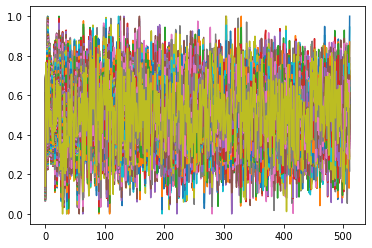

In [ ]:
plt.plot(y[0].squeeze().T)
plt.show()

In [ ]:
y.max(), y.min()

(tensor(1.), tensor(0.))

In [ ]:
X.shape

torch.Size([1, 199, 515])

In [ ]:
X[:,:,3:].max(),X[:,:,3:].min()

(tensor(0.7548), tensor(0.3832))

### DataLoaders

In [ ]:
trainDataLoader = DataLoader(dataset=trainDataset, batch_size=bz, shuffle=True, drop_last=True)
testDataLoader = DataLoader(dataset=testDataset, batch_size=bz)

## Model

In [ ]:
inputSize = X.shape[2]
hiddenSize = y.shape[2]
numLayers = 1
bidirectional = True
batch_first = True
#model = nn.LSTM(inputSize, hiddenSize, numLayers, batch_first=True, bidirectional=bidirectional)

In [ ]:
class LSTM(nn.Module):
    def __init__(self,inputSize=3, hiddenSize=512, numLayers=1, batch_first=True, bidirectional=False):
        super(LSTM,self).__init__()
        self.bidirectional = bidirectional
        self.lstm = nn.LSTM(inputSize, hiddenSize, numLayers, batch_first=batch_first, bidirectional=bidirectional)
        self.fc = nn.Linear(2*hiddenSize,hiddenSize)

    def forward(self,x):
        x,_ = self.lstm(x)
        if self.bidirectional:
            x = x.squeeze()
            x = self.fc(x)
        return x

In [ ]:
model = LSTM(inputSize, hiddenSize, numLayers, batch_first, bidirectional)
model

LSTM(
  (lstm): LSTM(515, 512, batch_first=True, bidirectional=True)
  (fc): Linear(in_features=1024, out_features=512, bias=True)
)

In [ ]:
output = model(X)
output.shape

torch.Size([199, 512])

In [ ]:
if len(gpu_ids.split(',')) > 1:
    model = nn.DataParallel(model)

In [ ]:
printNumModelParams(model)

10 layers require gradients (unfrozen) out of 10 layers
4,739,584 parameters require gradients (unfrozen) out of 4,739,584 parameters


## Loss Function

In [ ]:
L = nn.MSELoss()

In [ ]:
L(output,y)

/home/widemann1/anaconda3/envs/torch2/lib/python3.7/site-packages/torch/nn/modules/loss.py:431: UserWarning: Using a target size (torch.Size([1, 199, 512])) that is different to the input size (torch.Size([199, 512])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


tensor(0.2718, grad_fn=<MseLossBackward>)

In [ ]:
output.shape

torch.Size([199, 512])

In [ ]:
combined_loss = L(output,y)
combined_loss.backward()

## Set LR

Stopping early, the loss has diverged
Learning rate search finished. See the graph with {finder_name}.plot()



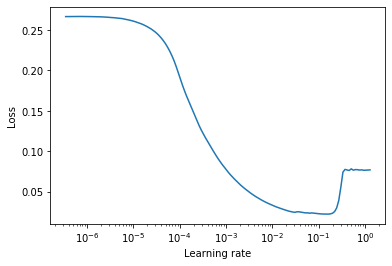

In [ ]:
if findLRs and (len(gpu_ids.split(','))==1): # doesn't work for multigpu???
    opt = create_opt(1e-7,model)
    find_lr(model,opt,L,device,trainDataLoader)


In [ ]:
max_lr = .001
opt = torch.optim.Adam(model.parameters())
lr_scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(opt,patience=patience)

In [ ]:
versionName = versionName + '_lr{}'.format(str(max_lr))

In [ ]:
versionName

'LIN_SVD_only_z_and_p_LSTM_bidirec_GPUs2_latentDim512_bz4_transformTrue_epochs1000_lr0.001'

## Train

In [ ]:
def trainEpoch(myDataLoader, tensorboard_writer, model, opt, loss,
               metric, lr_scheduler, tensorboard_rate, device,
               tensorboard_recorder_step, total_steps):
    running_loss = 0.0
    running_rmse = 0.0
    total_loss = 0.0
    for i, sampleBatch in enumerate(myDataLoader, start=1):

        # --- Main Training ---
        
        # gpu
        X,y = sampleBatch[0],sampleBatch[1]
        X = X.to(device)
        y = y.to(device)
        
        # zero the parameter gradients
        opt.zero_grad()

        y_hat = model(X)
        combined_loss = loss(y_hat,y)
        combined_loss.backward()
        opt.step()
        
        # loss
        batch_loss = combined_loss.item()
        running_loss += batch_loss
        total_loss += batch_loss

        # --- Metrics Recording ---

        # metrics
        r = metric(y_hat, y)
        running_rmse += r

        # record lr change
        total_steps += 1
        tensorboard_writer.add_scalar(tag="LR", scalar_value=opt.param_groups[0]['lr'], global_step=total_steps)

        # tensorboard writes
        if (i % tensorboard_rate == 0):
            tensorboard_recorder_step += 1
            avg_running_loss = running_loss/tensorboard_rate
            avg_running_rmse = running_rmse/tensorboard_rate
            tensorboard_writer.add_scalar(tag="Loss", scalar_value=avg_running_loss, global_step=tensorboard_recorder_step)
            tensorboard_writer.add_scalar(tag=metric.__name__, scalar_value=avg_running_rmse, global_step=tensorboard_recorder_step)
            # reset running_loss for the next set of batches. (tensorboard_rate number of batches)
            running_loss = 0.0
            running_rmse = 0.0

    return total_loss/len(myDataLoader), tensorboard_recorder_step, total_steps


In [ ]:
def validEpoch(myDataLoader, tensorboard_writer, model, loss, metric,
               device, tensorboard_recorder_step):
    running_loss = 0.0
    running_rmse = 0.0
    for i, sampleBatch in enumerate(myDataLoader, start=1):

        # --- Metrics Recording ---

        # gpu
        X,y = sampleBatch[0],sampleBatch[1]
        X = X.to(device)
        y = y.to(device)
        
        #perc = len(X)/len(myDataLoader.dataset)
        perc = 1./len(myDataLoader.dataset)
        # forward, no gradient calculations
        with torch.no_grad():
            y_hat = model(X)

        # loss
        combined_loss = loss(y_hat,y)
        
        running_loss += perc*(combined_loss.item())

        # metrics
        r = metric(y_hat, y)
        running_rmse += perc*r

    avg_running_loss = running_loss
    avg_running_rmse = running_rmse
    tensorboard_writer.add_scalar(tag="Loss", scalar_value=avg_running_loss, global_step=tensorboard_recorder_step)
    tensorboard_writer.add_scalar(tag=metric.__name__, scalar_value=avg_running_rmse, global_step=tensorboard_recorder_step)

    return running_loss

In [ ]:
try:
    os.mkdir(cps)
except:
    print("checkpoints directory already exists :)")

checkpoints directory already exists :)


In [ ]:
# create a summary writer.
train_writer = SummaryWriter(os.path.join(tensorboard_direc, versionName,'train'))
test_writer = SummaryWriter(os.path.join(tensorboard_direc, versionName,'valid'))
tensorboard_recorder_step = 0
total_steps = 0

In [ ]:
model = model.to(device)
writeMessage('---------- Started Training ----------', versionName)
bestLoss = np.infty

for epoch in tqdm(range(1, epochs+1)):  # loop over the dataset multiple times
    
    writeMessage("--- Epoch {0}/{1} ---".format(epoch, epochs), versionName)
    
    model.train()
    trainLoss, tensorboard_recorder_step, total_steps = trainEpoch(trainDataLoader, 
                                                                   train_writer, model, opt, L,
                                                                   rmse, lr_scheduler, 
                                                                   tensorboard_rate, device,
                                                                   tensorboard_recorder_step, total_steps)
    
    writeMessage("trainLoss: {:.4e}".format(trainLoss),versionName)
    writeMessage("LR: {:.4e}".format(opt.param_groups[0]['lr']),versionName)
#     if trainLoss < bestLoss:
#         bestLoss = trainLoss
#         writeMessage("Better trainLoss: {:.4e}, Saving models...".format(bestLoss),versionName)
#         torch.save(model.state_dict(), os.path.join(cps,versionName))
        
    model.eval()
    valLoss = validEpoch(testDataLoader, test_writer, model, L, rmse, device, tensorboard_recorder_step)
    writeMessage("valLoss: {:.4e}".format(valLoss),versionName)

    #checkpoint progress
    if valLoss < bestLoss:
        bestLoss = valLoss
        writeMessage("Better valLoss: {:.4e}, Saving models...".format(bestLoss),versionName)
        torch.save(model.state_dict(), os.path.join(cps,versionName))

    lr_scheduler.step(trainLoss)
    
    if opt.param_groups[0]['lr'] < 5e-8:
        break
writeMessage('---------- Finished Training ----------', versionName)

  0%|          | 0/1000 [00:00<?, ?it/s]

---------- Started Training ----------
--- Epoch 1/1000 ---


  0%|          | 1/1000 [00:00<11:23,  1.46it/s]

trainLoss: 3.7154e-02
LR: 1.0000e-03
valLoss: 4.3159e-03
Better valLoss: 4.3159e-03, Saving models...
--- Epoch 2/1000 ---


  0%|          | 2/1000 [00:01<11:23,  1.46it/s]

trainLoss: 1.1006e-02
LR: 1.0000e-03
valLoss: 3.7378e-03
Better valLoss: 3.7378e-03, Saving models...
--- Epoch 3/1000 ---


  0%|          | 3/1000 [00:02<11:25,  1.45it/s]

trainLoss: 1.0309e-02
LR: 1.0000e-03
valLoss: 3.6865e-03
Better valLoss: 3.6865e-03, Saving models...
--- Epoch 4/1000 ---


  0%|          | 4/1000 [00:02<11:07,  1.49it/s]

trainLoss: 1.0301e-02
LR: 1.0000e-03
valLoss: 3.6899e-03
--- Epoch 5/1000 ---


  0%|          | 5/1000 [00:03<10:53,  1.52it/s]

trainLoss: 1.0308e-02
LR: 1.0000e-03
valLoss: 3.6928e-03
--- Epoch 6/1000 ---


  1%|          | 6/1000 [00:04<11:04,  1.49it/s]

trainLoss: 1.0386e-02
LR: 1.0000e-03
valLoss: 3.6666e-03
Better valLoss: 3.6666e-03, Saving models...
--- Epoch 7/1000 ---


  1%|          | 7/1000 [00:04<10:52,  1.52it/s]

trainLoss: 1.0414e-02
LR: 1.0000e-03
valLoss: 3.6697e-03
--- Epoch 8/1000 ---


  1%|          | 8/1000 [00:05<10:42,  1.54it/s]

trainLoss: 1.0336e-02
LR: 1.0000e-03
valLoss: 3.7033e-03
--- Epoch 9/1000 ---


  1%|          | 9/1000 [00:05<10:35,  1.56it/s]

trainLoss: 1.0387e-02
LR: 1.0000e-03
valLoss: 3.6801e-03
--- Epoch 10/1000 ---


  1%|          | 10/1000 [00:06<10:31,  1.57it/s]

trainLoss: 1.0419e-02
LR: 1.0000e-03
valLoss: 3.6969e-03
--- Epoch 11/1000 ---


  1%|          | 11/1000 [00:07<10:46,  1.53it/s]

trainLoss: 1.0443e-02
LR: 1.0000e-03
valLoss: 3.6658e-03
Better valLoss: 3.6658e-03, Saving models...
--- Epoch 12/1000 ---


  1%|          | 12/1000 [00:07<10:39,  1.54it/s]

trainLoss: 1.0377e-02
LR: 1.0000e-03
valLoss: 3.6922e-03
--- Epoch 13/1000 ---


  1%|▏         | 13/1000 [00:08<10:33,  1.56it/s]

trainLoss: 1.0322e-02
LR: 1.0000e-03
valLoss: 3.6906e-03
--- Epoch 14/1000 ---


  1%|▏         | 14/1000 [00:09<10:28,  1.57it/s]

trainLoss: 1.0354e-02
LR: 1.0000e-03
valLoss: 3.6724e-03
--- Epoch 15/1000 ---


  2%|▏         | 15/1000 [00:09<10:25,  1.57it/s]

trainLoss: 1.0348e-02
LR: 1.0000e-03
valLoss: 3.6751e-03
--- Epoch 16/1000 ---


  2%|▏         | 16/1000 [00:10<10:38,  1.54it/s]

trainLoss: 1.0163e-02
LR: 1.0000e-04
valLoss: 3.6308e-03
Better valLoss: 3.6308e-03, Saving models...
--- Epoch 17/1000 ---


  2%|▏         | 17/1000 [00:11<10:50,  1.51it/s]

trainLoss: 1.0117e-02
LR: 1.0000e-04
valLoss: 3.6228e-03
Better valLoss: 3.6228e-03, Saving models...
--- Epoch 18/1000 ---


  2%|▏         | 18/1000 [00:11<10:41,  1.53it/s]

trainLoss: 1.0088e-02
LR: 1.0000e-04
valLoss: 3.6233e-03
--- Epoch 19/1000 ---


  2%|▏         | 19/1000 [00:12<10:34,  1.55it/s]

trainLoss: 1.0173e-02
LR: 1.0000e-04
valLoss: 3.6256e-03
--- Epoch 20/1000 ---


  2%|▏         | 20/1000 [00:13<10:28,  1.56it/s]

trainLoss: 1.0178e-02
LR: 1.0000e-04
valLoss: 3.6229e-03
--- Epoch 21/1000 ---


  2%|▏         | 21/1000 [00:13<10:25,  1.57it/s]

trainLoss: 1.0251e-02
LR: 1.0000e-04
valLoss: 3.6236e-03
--- Epoch 22/1000 ---


  2%|▏         | 22/1000 [00:14<10:39,  1.53it/s]

trainLoss: 1.0068e-02
LR: 1.0000e-04
valLoss: 3.6218e-03
Better valLoss: 3.6218e-03, Saving models...
--- Epoch 23/1000 ---


  2%|▏         | 23/1000 [00:14<10:32,  1.54it/s]

trainLoss: 1.0186e-02
LR: 1.0000e-04
valLoss: 3.6245e-03
--- Epoch 24/1000 ---


  2%|▏         | 24/1000 [00:15<10:45,  1.51it/s]

trainLoss: 1.0155e-02
LR: 1.0000e-04
valLoss: 3.6217e-03
Better valLoss: 3.6217e-03, Saving models...
--- Epoch 25/1000 ---


  2%|▎         | 25/1000 [00:16<10:37,  1.53it/s]

trainLoss: 1.0168e-02
LR: 1.0000e-04
valLoss: 3.6224e-03
--- Epoch 26/1000 ---


  3%|▎         | 26/1000 [00:16<10:29,  1.55it/s]

trainLoss: 1.0136e-02
LR: 1.0000e-04
valLoss: 3.6244e-03
--- Epoch 27/1000 ---


  3%|▎         | 27/1000 [00:17<10:23,  1.56it/s]

trainLoss: 1.0146e-02
LR: 1.0000e-04
valLoss: 3.6245e-03
--- Epoch 28/1000 ---


  3%|▎         | 28/1000 [00:18<10:38,  1.52it/s]

trainLoss: 1.0180e-02
LR: 1.0000e-04
valLoss: 3.6217e-03
Better valLoss: 3.6217e-03, Saving models...
--- Epoch 29/1000 ---


  3%|▎         | 29/1000 [00:18<10:47,  1.50it/s]

trainLoss: 1.0179e-02
LR: 1.0000e-04
valLoss: 3.6198e-03
Better valLoss: 3.6198e-03, Saving models...
--- Epoch 30/1000 ---


  3%|▎         | 30/1000 [00:19<10:37,  1.52it/s]

trainLoss: 1.0159e-02
LR: 1.0000e-04
valLoss: 3.6235e-03
--- Epoch 31/1000 ---


  3%|▎         | 31/1000 [00:20<10:29,  1.54it/s]

trainLoss: 1.0163e-02
LR: 1.0000e-04
valLoss: 3.6207e-03
--- Epoch 32/1000 ---


  3%|▎         | 32/1000 [00:20<10:23,  1.55it/s]

trainLoss: 1.0121e-02
LR: 1.0000e-04
valLoss: 3.6266e-03
--- Epoch 33/1000 ---


  3%|▎         | 33/1000 [00:21<10:37,  1.52it/s]

trainLoss: 1.0103e-02
LR: 1.0000e-04
valLoss: 3.6196e-03
Better valLoss: 3.6196e-03, Saving models...
--- Epoch 34/1000 ---


  3%|▎         | 34/1000 [00:22<10:44,  1.50it/s]

trainLoss: 1.0230e-02
LR: 1.0000e-05
valLoss: 3.6177e-03
Better valLoss: 3.6177e-03, Saving models...
--- Epoch 35/1000 ---


  4%|▎         | 35/1000 [00:22<10:50,  1.48it/s]

trainLoss: 1.0076e-02
LR: 1.0000e-05
valLoss: 3.6173e-03
Better valLoss: 3.6173e-03, Saving models...
--- Epoch 36/1000 ---


  4%|▎         | 36/1000 [00:23<10:38,  1.51it/s]

trainLoss: 1.0130e-02
LR: 1.0000e-05
valLoss: 3.6178e-03
--- Epoch 37/1000 ---


  4%|▎         | 37/1000 [00:24<10:29,  1.53it/s]

trainLoss: 1.0169e-02
LR: 1.0000e-05
valLoss: 3.6180e-03
--- Epoch 38/1000 ---


  4%|▍         | 38/1000 [00:24<10:22,  1.54it/s]

trainLoss: 1.0187e-02
LR: 1.0000e-05
valLoss: 3.6176e-03
--- Epoch 39/1000 ---


  4%|▍         | 39/1000 [00:25<10:17,  1.56it/s]

trainLoss: 1.0146e-02
LR: 1.0000e-05
valLoss: 3.6178e-03
--- Epoch 40/1000 ---


  4%|▍         | 40/1000 [00:26<10:12,  1.57it/s]

trainLoss: 1.0062e-02
LR: 1.0000e-05
valLoss: 3.6185e-03
--- Epoch 41/1000 ---


  4%|▍         | 41/1000 [00:26<10:08,  1.58it/s]

trainLoss: 1.0070e-02
LR: 1.0000e-05
valLoss: 3.6187e-03
--- Epoch 42/1000 ---


  4%|▍         | 42/1000 [00:27<10:07,  1.58it/s]

trainLoss: 1.0064e-02
LR: 1.0000e-05
valLoss: 3.6182e-03
--- Epoch 43/1000 ---


  4%|▍         | 43/1000 [00:27<10:06,  1.58it/s]

trainLoss: 1.0136e-02
LR: 1.0000e-05
valLoss: 3.6178e-03
--- Epoch 44/1000 ---


  4%|▍         | 44/1000 [00:28<10:21,  1.54it/s]

trainLoss: 1.0037e-02
LR: 1.0000e-05
valLoss: 3.6169e-03
Better valLoss: 3.6169e-03, Saving models...
--- Epoch 45/1000 ---


  4%|▍         | 45/1000 [00:29<10:15,  1.55it/s]

trainLoss: 1.0190e-02
LR: 1.0000e-05
valLoss: 3.6174e-03
--- Epoch 46/1000 ---


  5%|▍         | 46/1000 [00:29<10:10,  1.56it/s]

trainLoss: 1.0113e-02
LR: 1.0000e-05
valLoss: 3.6176e-03
--- Epoch 47/1000 ---


  5%|▍         | 47/1000 [00:30<10:07,  1.57it/s]

trainLoss: 1.0089e-02
LR: 1.0000e-05
valLoss: 3.6181e-03
--- Epoch 48/1000 ---


  5%|▍         | 48/1000 [00:31<10:05,  1.57it/s]

trainLoss: 1.0114e-02
LR: 1.0000e-05
valLoss: 3.6179e-03
--- Epoch 49/1000 ---


  5%|▍         | 49/1000 [00:31<10:02,  1.58it/s]

trainLoss: 1.0114e-02
LR: 1.0000e-05
valLoss: 3.6176e-03
--- Epoch 50/1000 ---


  5%|▌         | 50/1000 [00:32<10:00,  1.58it/s]

trainLoss: 1.0128e-02
LR: 1.0000e-05
valLoss: 3.6183e-03
--- Epoch 51/1000 ---


  5%|▌         | 51/1000 [00:33<10:00,  1.58it/s]

trainLoss: 1.0146e-02
LR: 1.0000e-05
valLoss: 3.6182e-03
--- Epoch 52/1000 ---


  5%|▌         | 52/1000 [00:33<10:00,  1.58it/s]

trainLoss: 1.0209e-02
LR: 1.0000e-05
valLoss: 3.6174e-03
--- Epoch 53/1000 ---


  5%|▌         | 53/1000 [00:34<09:58,  1.58it/s]

trainLoss: 1.0172e-02
LR: 1.0000e-05
valLoss: 3.6173e-03
--- Epoch 54/1000 ---


  5%|▌         | 54/1000 [00:34<09:58,  1.58it/s]

trainLoss: 1.0154e-02
LR: 1.0000e-05
valLoss: 3.6178e-03
--- Epoch 55/1000 ---


  6%|▌         | 55/1000 [00:35<09:56,  1.58it/s]

trainLoss: 1.0221e-02
LR: 1.0000e-05
valLoss: 3.6180e-03
--- Epoch 56/1000 ---


  6%|▌         | 56/1000 [00:36<09:54,  1.59it/s]

trainLoss: 1.0172e-02
LR: 1.0000e-06
valLoss: 3.6179e-03
--- Epoch 57/1000 ---


  6%|▌         | 57/1000 [00:36<09:54,  1.59it/s]

trainLoss: 1.0171e-02
LR: 1.0000e-06
valLoss: 3.6178e-03
--- Epoch 58/1000 ---


  6%|▌         | 58/1000 [00:37<09:53,  1.59it/s]

trainLoss: 1.0131e-02
LR: 1.0000e-06
valLoss: 3.6178e-03
--- Epoch 59/1000 ---


  6%|▌         | 59/1000 [00:38<09:54,  1.58it/s]

trainLoss: 1.0174e-02
LR: 1.0000e-06
valLoss: 3.6178e-03
--- Epoch 60/1000 ---


  6%|▌         | 60/1000 [00:38<09:53,  1.58it/s]

trainLoss: 1.0158e-02
LR: 1.0000e-06
valLoss: 3.6177e-03
--- Epoch 61/1000 ---


  6%|▌         | 61/1000 [00:39<09:51,  1.59it/s]

trainLoss: 1.0222e-02
LR: 1.0000e-06
valLoss: 3.6178e-03
--- Epoch 62/1000 ---


  6%|▌         | 62/1000 [00:39<09:50,  1.59it/s]

trainLoss: 1.0158e-02
LR: 1.0000e-06
valLoss: 3.6179e-03
--- Epoch 63/1000 ---


  6%|▋         | 63/1000 [00:40<09:48,  1.59it/s]

trainLoss: 1.0152e-02
LR: 1.0000e-06
valLoss: 3.6177e-03
--- Epoch 64/1000 ---


  6%|▋         | 64/1000 [00:41<09:48,  1.59it/s]

trainLoss: 1.0072e-02
LR: 1.0000e-06
valLoss: 3.6177e-03
--- Epoch 65/1000 ---


  6%|▋         | 65/1000 [00:41<09:47,  1.59it/s]

trainLoss: 1.0056e-02
LR: 1.0000e-06
valLoss: 3.6177e-03
--- Epoch 66/1000 ---


  7%|▋         | 66/1000 [00:42<09:47,  1.59it/s]

trainLoss: 1.0059e-02
LR: 1.0000e-06
valLoss: 3.6177e-03
--- Epoch 67/1000 ---


  7%|▋         | 67/1000 [00:43<09:47,  1.59it/s]

trainLoss: 1.0126e-02
LR: 1.0000e-07
valLoss: 3.6177e-03
--- Epoch 68/1000 ---


  7%|▋         | 68/1000 [00:43<09:45,  1.59it/s]

trainLoss: 1.0069e-02
LR: 1.0000e-07
valLoss: 3.6177e-03
--- Epoch 69/1000 ---


  7%|▋         | 69/1000 [00:44<09:45,  1.59it/s]

trainLoss: 1.0204e-02
LR: 1.0000e-07
valLoss: 3.6177e-03
--- Epoch 70/1000 ---


  7%|▋         | 70/1000 [00:45<09:44,  1.59it/s]

trainLoss: 1.0149e-02
LR: 1.0000e-07
valLoss: 3.6177e-03
--- Epoch 71/1000 ---


  7%|▋         | 71/1000 [00:45<09:43,  1.59it/s]

trainLoss: 1.0171e-02
LR: 1.0000e-07
valLoss: 3.6177e-03
--- Epoch 72/1000 ---


  7%|▋         | 72/1000 [00:46<09:41,  1.60it/s]

trainLoss: 1.0237e-02
LR: 1.0000e-07
valLoss: 3.6177e-03
--- Epoch 73/1000 ---


  7%|▋         | 73/1000 [00:46<09:41,  1.59it/s]

trainLoss: 1.0132e-02
LR: 1.0000e-07
valLoss: 3.6177e-03
--- Epoch 74/1000 ---


  7%|▋         | 74/1000 [00:47<09:40,  1.60it/s]

trainLoss: 1.0164e-02
LR: 1.0000e-07
valLoss: 3.6177e-03
--- Epoch 75/1000 ---


  8%|▊         | 75/1000 [00:48<09:39,  1.60it/s]

trainLoss: 1.0171e-02
LR: 1.0000e-07
valLoss: 3.6177e-03
--- Epoch 76/1000 ---


  8%|▊         | 76/1000 [00:48<09:39,  1.60it/s]

trainLoss: 1.0116e-02
LR: 1.0000e-07
valLoss: 3.6177e-03
--- Epoch 77/1000 ---
trainLoss: 1.0128e-02
LR: 1.0000e-07
valLoss: 3.6177e-03
---------- Finished Training ----------


## Compare: Generated vs. Simulated

In [ ]:
model.load_state_dict(torch.load(os.path.join(cps,versionName)))
model = model.to(device)

In [ ]:
model.eval()

LSTM(
  (lstm): LSTM(515, 512, batch_first=True, bidirectional=True)
  (fc): Linear(in_features=1024, out_features=512, bias=True)
)

In [ ]:
testDataLoader = DataLoader(dataset=testDataset, batch_size=1)
X,y = next(iter(testDataLoader))
y = y.to(device)
X.shape, y.shape

(torch.Size([1, 199, 515]), torch.Size([1, 199, 512]))

In [ ]:
batch_out = model(X.to(device))
batch_out.shape

torch.Size([199, 512])

In [ ]:
batch_out = batch_out.squeeze()
y = y.squeeze()
err = []
for i in range(simLen-1):
    err.append(torch.norm(y[i] - batch_out[i]))
err

[tensor(0.6503, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.3217, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.2650, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.3029, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.3471, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.3931, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.4399, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.4874, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.5348, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.5817, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.6270, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.6700, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.7099, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.7446, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.7750, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.8017, device='cuda:0', grad_fn=<NormBackward0>),
 tensor(0.8267, device='cuda:0', grad_fn=<NormBackward0>

In [ ]:
d = batch_out - y
d.shape

torch.Size([199, 512])

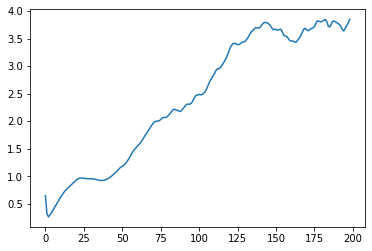

In [ ]:
import matplotlib.pyplot as plt
plt.plot(err)

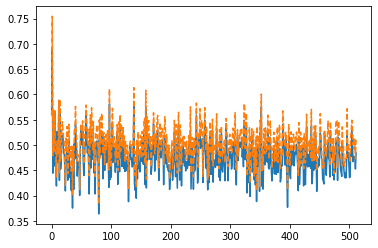

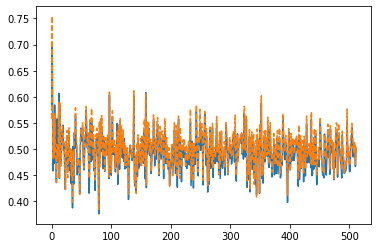

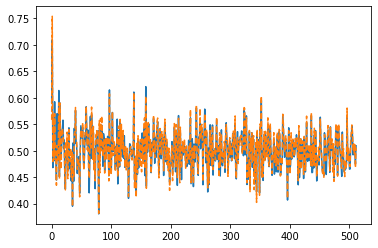

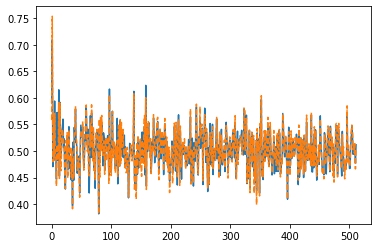

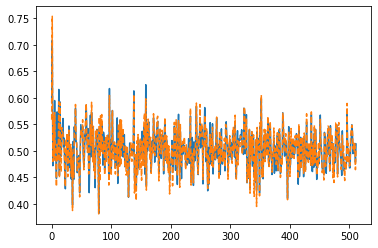

...

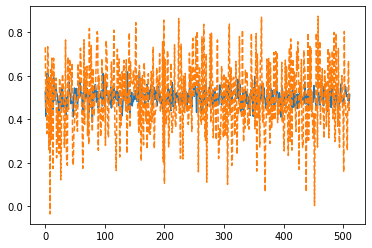

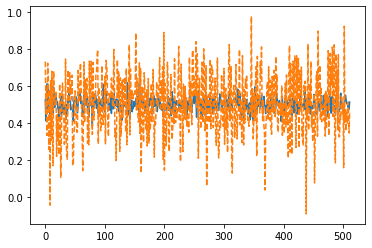

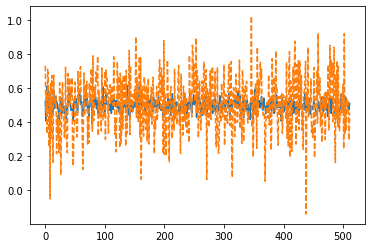

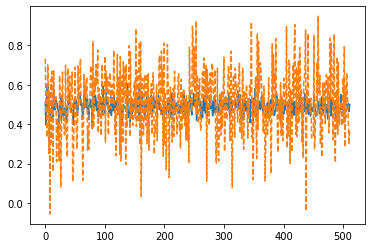

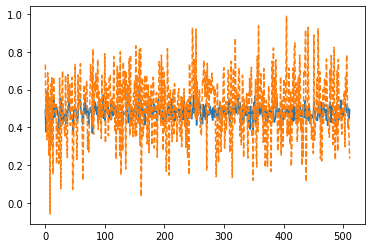

In [ ]:
t = np.arange(512)
for dd,yy in zip(batch_out,y):
    plt.plot(t, dd.detach().cpu().numpy(),t, yy.detach().cpu().numpy(),'--')
    plt.show()

In [ ]:
tmp = y.detach().cpu().numpy()
tmp.max(), tmp.min()

(1.1795659, -0.15067996)

In [ ]:
bb = batch_out.detach().cpu().numpy()
bb.max(), bb.min()

(0.7096162, 0.3637401)

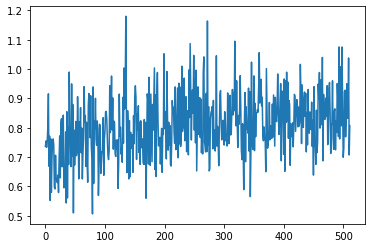

In [ ]:
plt.plot(tmp.max(axis=0))
plt.show()

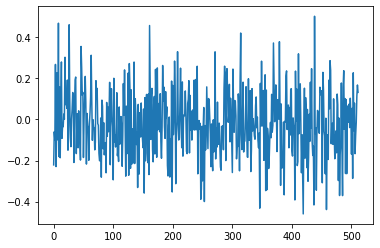

In [ ]:
plt.plot(d[-2].detach().cpu().numpy())
plt.show()

In [ ]:
from sklearn.manifold import TSNE
X = y.detach().cpu().numpy()
X.shape

(199, 512)

In [ ]:
X_embedded = TSNE(n_components=2,verbose=3).fit_transform(X)
X_embedded.shape

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 199 samples in 0.008s...
[t-SNE] Computed neighbors for 199 samples in 0.020s...
[t-SNE] Computed conditional probabilities for sample 199 / 199
[t-SNE] Mean sigma: 0.022782
[t-SNE] Computed conditional probabilities in 0.013s
[t-SNE] Iteration 50: error = 51.8254356, gradient norm = 0.5481957 (50 iterations in 0.027s)
[t-SNE] Iteration 100: error = 51.6541252, gradient norm = 0.5155737 (50 iterations in 0.023s)
[t-SNE] Iteration 150: error = 50.9545403, gradient norm = 0.5189195 (50 iterations in 0.022s)
[t-SNE] Iteration 200: error = 50.2209320, gradient norm = 0.5149332 (50 iterations in 0.022s)
[t-SNE] Iteration 250: error = 49.5238228, gradient norm = 0.5370497 (50 iterations in 0.022s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 49.523823
[t-SNE] Iteration 300: error = 0.1323734, gradient norm = 0.0034463 (50 iterations in 0.022s)
[t-SNE] Iteration 350: error = 0.1272703, gradient norm = 0.0004604 (

(199, 2)

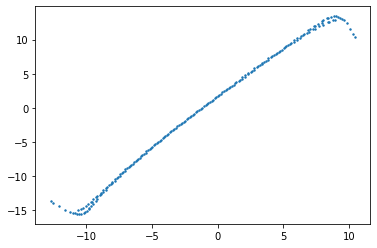

In [ ]:
plt.scatter(X_embedded[:,0],X_embedded[:,1],s=2)
plt.show()

In [ ]:
X = batch_out.detach().cpu().numpy()
X_embedded = TSNE(n_components=2,verbose=3).fit_transform(X)
X_embedded.shape

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 199 samples in 0.007s...
[t-SNE] Computed neighbors for 199 samples in 0.019s...
[t-SNE] Computed conditional probabilities for sample 199 / 199
[t-SNE] Mean sigma: 0.022782
[t-SNE] Computed conditional probabilities in 0.012s
[t-SNE] Iteration 50: error = 52.0572815, gradient norm = 0.5355496 (50 iterations in 0.028s)
[t-SNE] Iteration 100: error = 51.1903915, gradient norm = 0.5011649 (50 iterations in 0.023s)
[t-SNE] Iteration 150: error = 49.6248627, gradient norm = 0.5789031 (50 iterations in 0.022s)
[t-SNE] Iteration 200: error = 50.8225784, gradient norm = 0.5231470 (50 iterations in 0.022s)
[t-SNE] Iteration 250: error = 49.1989861, gradient norm = 0.5563083 (50 iterations in 0.022s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 49.198986
[t-SNE] Iteration 300: error = 0.1289933, gradient norm = 0.0017703 (50 iterations in 0.020s)
[t-SNE] Iteration 350: error = 0.1272726, gradient norm = 0.0004919 (

(199, 2)

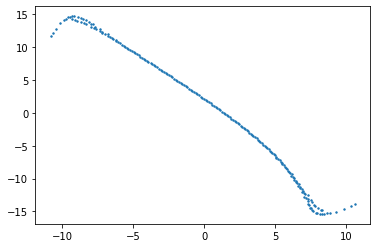

In [ ]:
plt.scatter(X_embedded[:,0],X_embedded[:,1],s=2)
plt.show()